# Analysis of scRNA-seq data from activated PBMCs in TWINS only

In CVID and healthy control, 10X platform

16.02.2021: reanalysis, correcting the bug in bertie function

(Preprocessing happened in notebook M0)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

absl-py==0.12.0
aiohttp==3.7.4.post0
airr==1.3.1
alabaster==0.7.12
alembic @ file:///home/conda/feedstock_root/build_artifacts/alembic_1613901514078/work
anndata @ file:///home/conda/feedstock_root/build_artifacts/anndata_1605539061264/work
annoy @ file:///home/conda/feedstock_root/build_artifacts/python-annoy_1610271511811/work
anyio @ file:///home/conda/feedstock_root/build_artifacts/anyio_1614388751160/work/dist
arboreto==0.1.6
argon2-cffi @ file:///home/conda/feedstock_root/build_artifacts/argon2-cffi_1610522574055/work
async-generator==1.10
async-timeout==3.0.1
attrs @ file:///home/conda/feedstock_root/build_artifacts/attrs_1605083924122/work
Babel @ file:///home/conda/feedstock_root/build_artifacts/babel_1605182336601/work
backcall @ file:///home/conda/feedstock_root/build_artifacts/backcall_1592338393461/work
backports.functools-lru-cache==1.6.1
bbknn @ file:///opt/conda/conda-bld/bbknn_1616434096000/work
bleach @ file:///home/conda/feedstock_root/build_artifacts/bleach_16122134

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyte

A Benjamini-Hochberg function for later. Running FDR is surprisingly inconvenient using built-in Python options.

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

## Reding the preprocessed object

Preprocessing happened in M1-0 notebook, preliminary analysis - in notebook M1-1

In [25]:
# reading
adata = sc.read(save_path+'adata_raw_filtered.h5ad')

In [26]:
adata

AnnData object with n_obs × n_vars = 17662 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

In [27]:
# reading object with final annotation (as done in M4 notebook)
# AND also reading separate B cell object where some T:B doublets (CD3+CD19+) were removed - those are the final B cells to take 
adata_final_annot = sc.read(save_path + 'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation.h5ad')
adata_B_cells_final = sc.read(save_path + 'adata_hvg_BBKNN_by_sample_nodoublets_B_cells_cleanup_final_manifold.h5ad')

In [28]:
adata_final_annot

AnnData object with n_obs × n_vars = 17105 × 2423
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'ccgs', 'cell_type_colors', 'celltype_predictions_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'conne

In [29]:
#len(set(adata.obs_names) & set(adata_final_annot.obs_names))

In [30]:
np.unique(adata_final_annot.obs['cell_type'], return_counts=True)

(array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
        'B_cells_naive_activated', 'B_cells_oligoclonal', 'MAIT_cells',
        'MAIT_cells_activated', 'Myeloid_cells', 'NK_CD16_bright',
        'NK_CD16_bright_activated', 'NK_CD56_bright',
        'NK_CD56_bright_activated', 'T4_activated', 'T4_memory',
        'T4_naive', 'T8_activated_1', 'T8_activated_2', 'T8_memory',
        'T8_naive', 'T_gd', 'T_regs'], dtype=object),
 array([ 391, 2472, 1568,  696,  196,  299,  219,  285,  763, 1235,  238,
         200, 1739, 1772,  675,  830,  288,  558,  408,  697, 1576]))

In [31]:
np.unique(adata_B_cells_final.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object)

In [32]:
adata_B_cells_final

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'cell_type_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [33]:
B_cell_indices = list(adata_B_cells_final.obs_names)

# all except for B cell groups
rest_of_cell_type_indices = list(adata_final_annot[-adata_final_annot.obs['cell_type'].isin(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'])].obs_names)

final_inidices = B_cell_indices + rest_of_cell_type_indices

In [34]:
len(B_cell_indices)

5119

In [35]:
len(rest_of_cell_type_indices)

11782

Trying to set attribute `.uns` of view, copying.


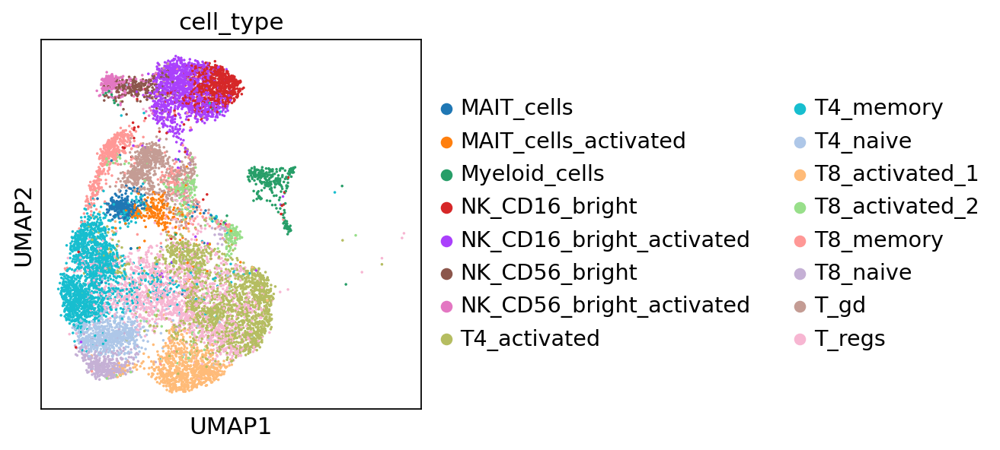

In [36]:
sc.pl.umap(adata_final_annot[rest_of_cell_type_indices,:], color='cell_type')

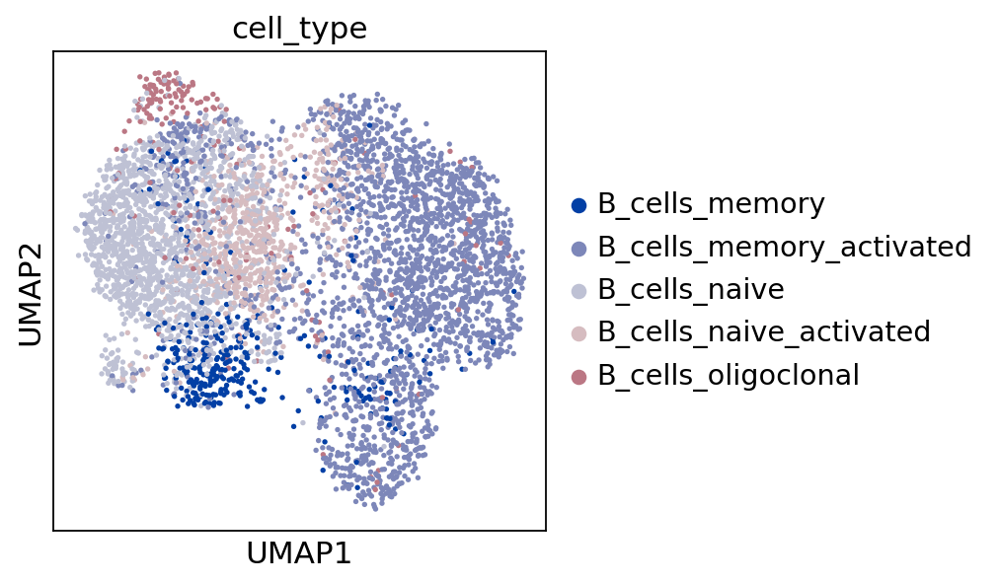

In [39]:
sc.pl.umap(adata_B_cells_final[B_cell_indices,:], color=['cell_type'])

In [40]:
len(final_inidices)

16901

In [41]:
# subsetting adata to only final cells
adata = adata[final_inidices,:].copy()

In [42]:
adata

AnnData object with n_obs × n_vars = 16901 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

In [43]:
# transferring annotation along with some other useful metrics

cols2add = ['probabilities', 'celltype_predictions', 'cell_type']

for col in cols2add:
    adata.obs[col] = adata_final_annot.obs.loc[adata.obs_names, col]

In [44]:
np.unique(adata.obs['sample'])

array(['Immunodeficiency8103070', 'Immunodeficiency8103072',
       'Immunodeficiency8103073', 'Immunodeficiency8103074',
       'Immunodeficiency8103076', 'Immunodeficiency8103077'], dtype=object)

In [45]:
expr_mtx_check = adata[adata.obs['sample'] == 'Immunodeficiency8103070'].X.todense()
np.unique(expr_mtx_check)

matrix([[   0.,    0.,    0., ..., 2261., 2508., 2668.]], dtype=float32)

___________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [46]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Second step of bertie doublet removal - will be done later in the pipeline

_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes

There are no cycle genes, so skipping this here

extracting highly variable genes
    finished (0:00:00)


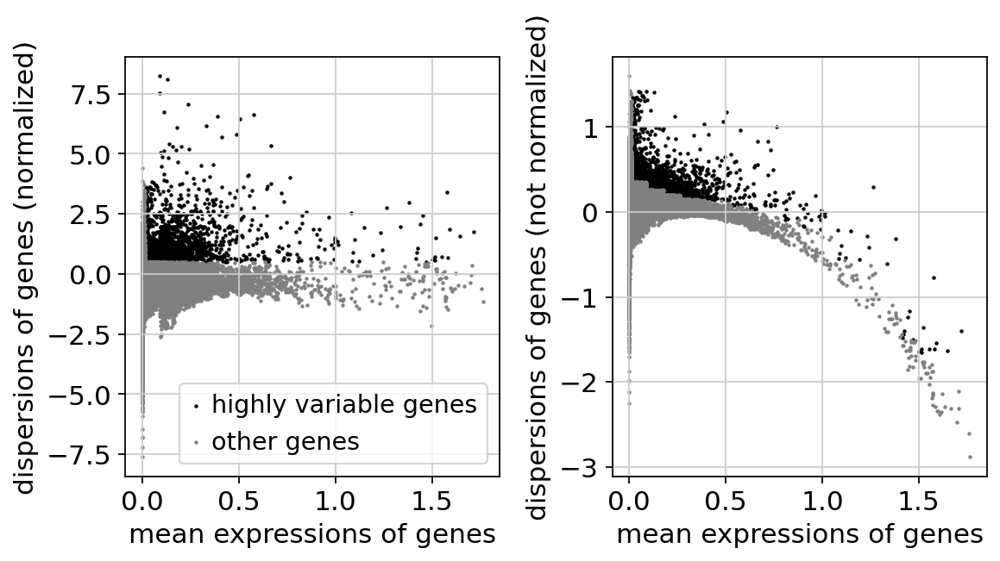

In [47]:
cellcycle_adata = adata.copy()
# Extract highly variable genes
filter_result = sc.pp.filter_genes_dispersion(
    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [48]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [49]:
%%time
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata, n_comps=30)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    with n_comps=30
    finished (0:00:01)
CPU times: user 9.51 s, sys: 8.32 s, total: 17.8 s
Wall time: 1.88 s


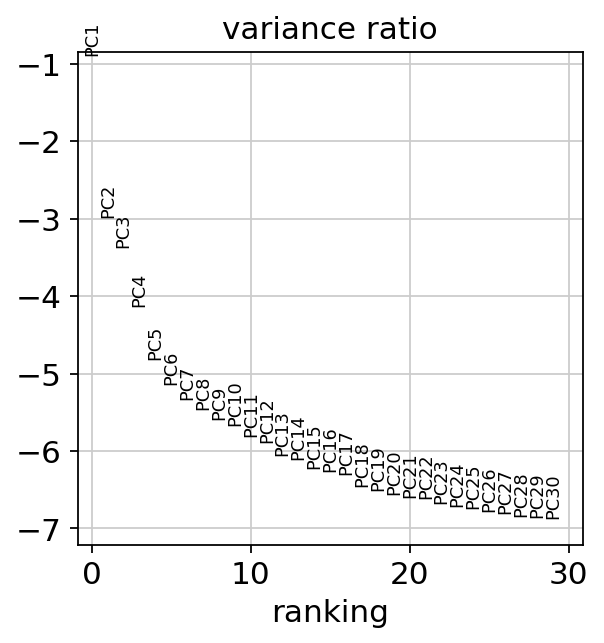

In [50]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 18
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


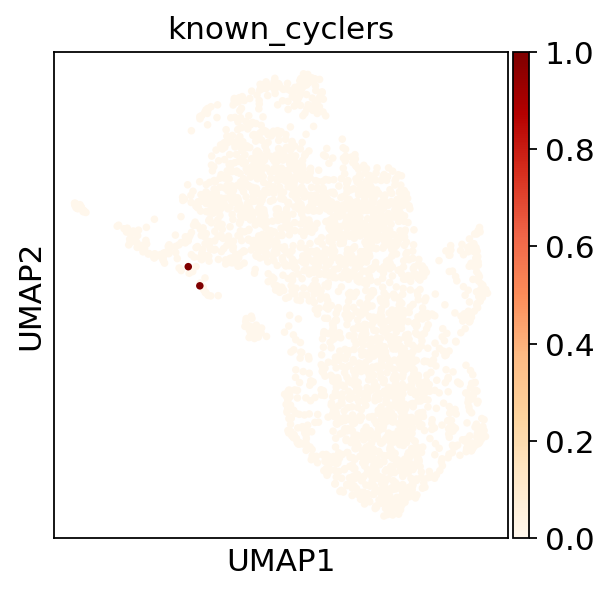

In [51]:
# Identify genes behaving like cc genes
num_pcs = 18
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


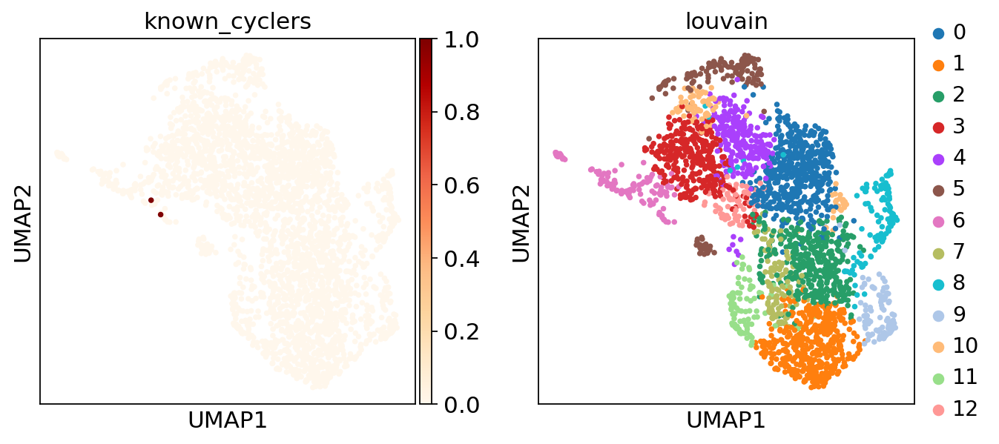

In [52]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [53]:
'CDK1' in cellcycle_adata.obs_names

False

In [54]:
'MKI67' in cellcycle_adata.obs_names

True

In [55]:
'CCNB2' in cellcycle_adata.obs_names

False

In [56]:
'PCNA' in cellcycle_adata.obs_names

True

In [57]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[[#'CDK1',
    'MKI67',
    #'CCNB2',
    'PCNA'],'louvain'])


index
MKI67    6
PCNA     6
Name: louvain, dtype: category
Categories (13, object): [0, 1, 2, 3, ..., 9, 10, 11, 12]


In [58]:
adata

AnnData object with n_obs × n_vars = 16901 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    uns: 'log1p'

So removing genes from cluster 6 by filtering the main matrix

In [59]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='6')].index)
# Remove cc genes
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]


In [60]:
adata

View of AnnData object with n_obs × n_vars = 16901 × 17861
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    uns: 'log1p', 'ccgs'

In [61]:
%%time
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

# takes a few minutes

calculating cell cycle phase
computing score 'S_score'


Trying to set attribute `.obs` of view, copying.


    finished: added
    'S_score', score of gene set (adata.obs).
    467 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    701 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)
CPU times: user 1.18 s, sys: 368 ms, total: 1.54 s
Wall time: 1.55 s


In [62]:
adata

AnnData object with n_obs × n_vars = 16901 × 17861
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    uns: 'log1p', 'ccgs'

_______________________________________________________________________________________________________

# Subsetting to HVGs and scaling

In [63]:
%%time
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 1.36 s, sys: 12 ms, total: 1.37 s
Wall time: 1.37 s


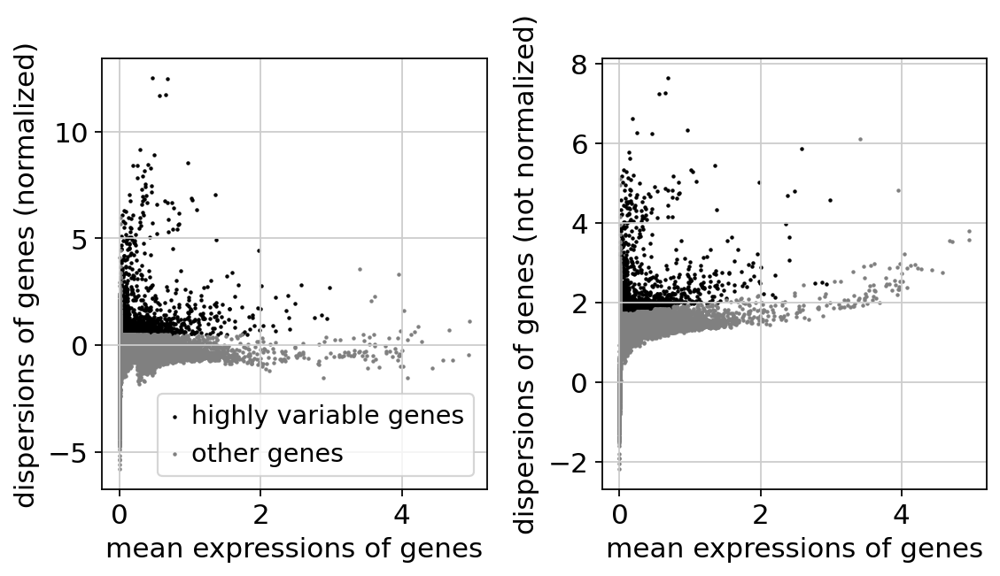

CPU times: user 472 ms, sys: 4 ms, total: 476 ms
Wall time: 477 ms


In [64]:
%%time
sc.pl.highly_variable_genes(adata)

In [65]:
adata_hvg = adata[:, adata.var['highly_variable']]

In [66]:
adata_hvg

View of AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'ccgs', 'hvg'

In [67]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
CPU times: user 700 ms, sys: 236 ms, total: 936 ms
Wall time: 935 ms


________

## PCA

In [68]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack', n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)
CPU times: user 34.7 s, sys: 1min 9s, total: 1min 43s
Wall time: 7.92 s


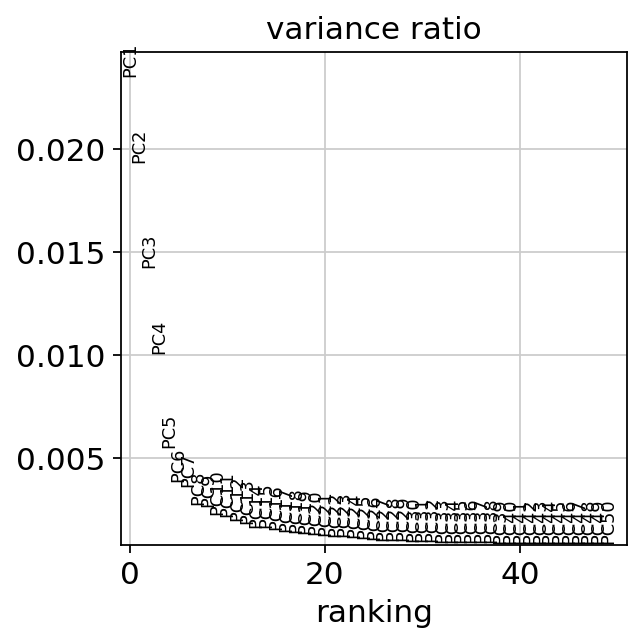

In [69]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

### BBKNN by `sample`


In [70]:
%%time
bbknn.bbknn(adata_hvg, batch_key='sample')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:04)
CPU times: user 4.02 s, sys: 0 ns, total: 4.02 s
Wall time: 4.03 s


/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:289: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:290: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


__________________________________________________________________________________________________________________________________________________________________

In [71]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
CPU times: user 18.9 s, sys: 2.91 s, total: 21.8 s
Wall time: 17.8 s


# Plotting

In [72]:
adata_hvg

AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [73]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

### BBKNN by `sample`

50 PCs

... storing 'phase' as categorical


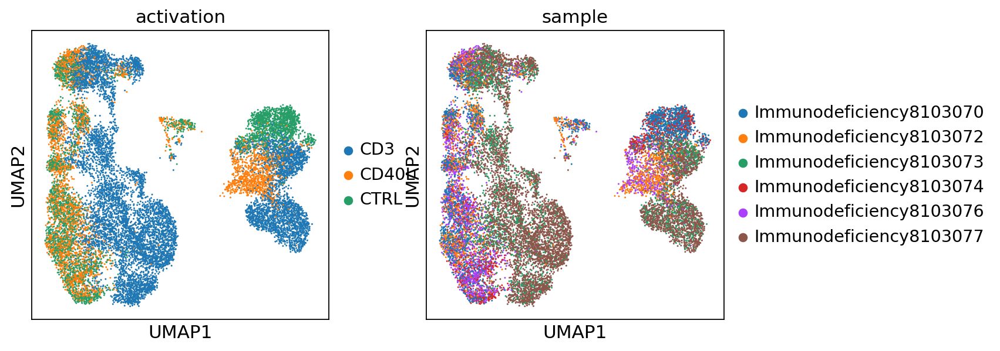

In [74]:
sc.pl.umap(adata_hvg, color=['activation','sample'])

In [75]:
adata_hvg.obs['cell_type'] = adata_final_annot.obs.loc[adata_hvg.obs_names, 'cell_type']

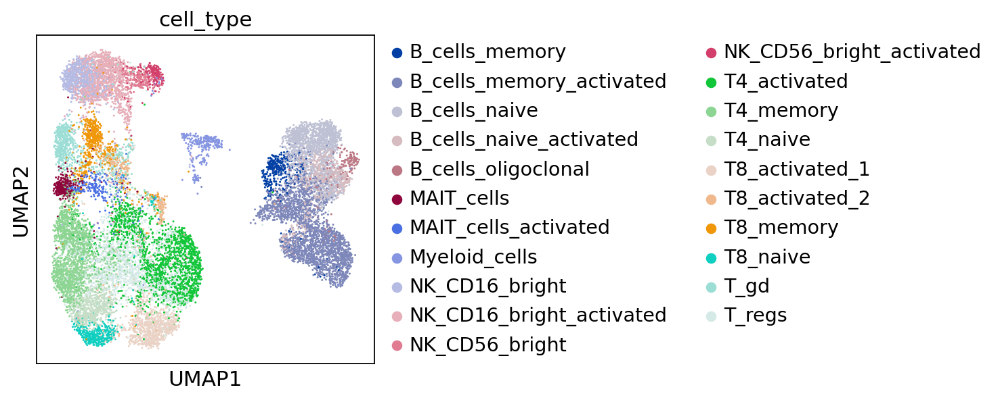

In [76]:
sc.pl.umap(adata_hvg, color=['cell_type'])

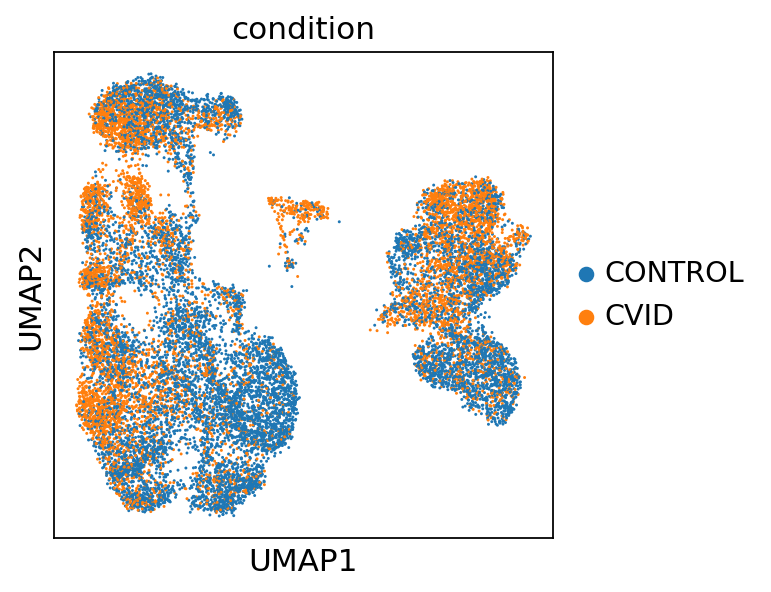

In [77]:
sc.pl.umap(adata_hvg, color=['condition'])

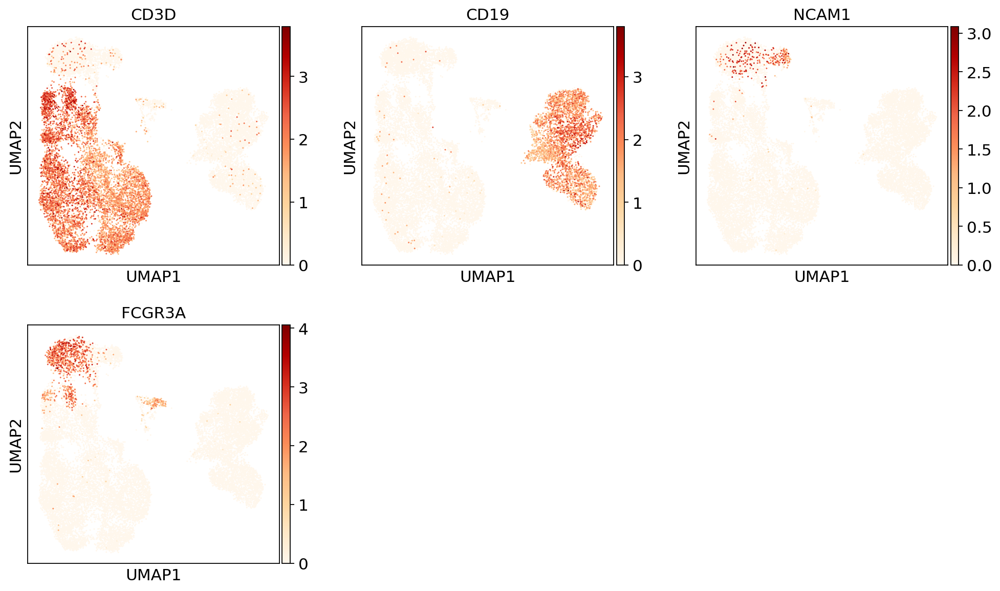

In [78]:
sc.pl.umap(adata_hvg, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

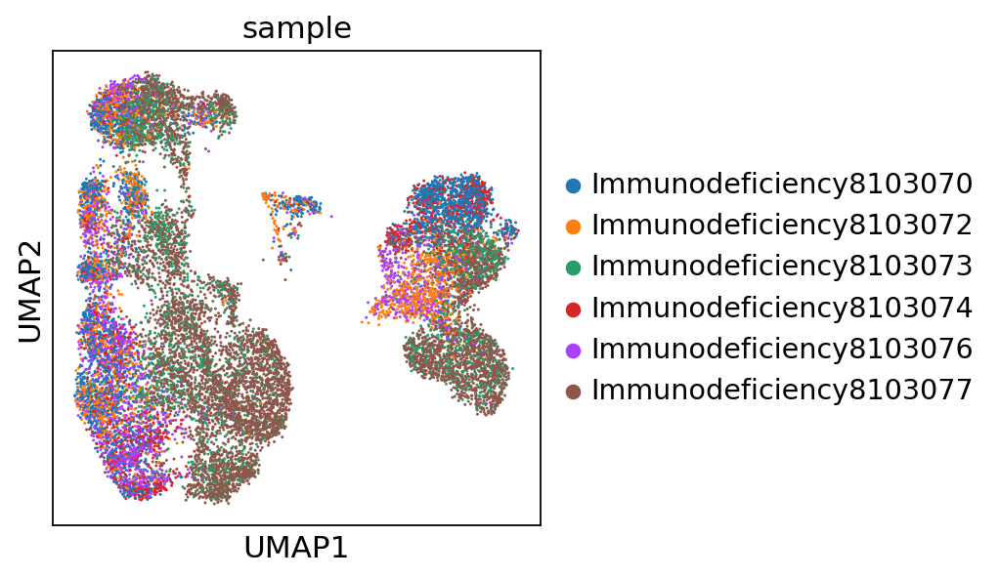

In [79]:
sc.pl.umap(adata_hvg, color=['sample'])

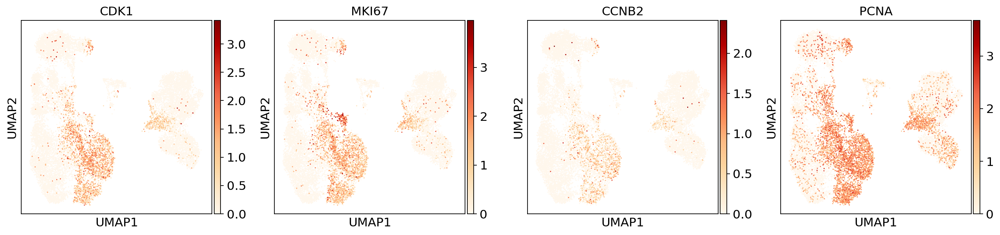

In [80]:
sc.pl.umap(adata_hvg, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [81]:
adata_hvg

AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap', 'activation_colors', 'sample_colors', 'cell_type_colors', 'condition_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

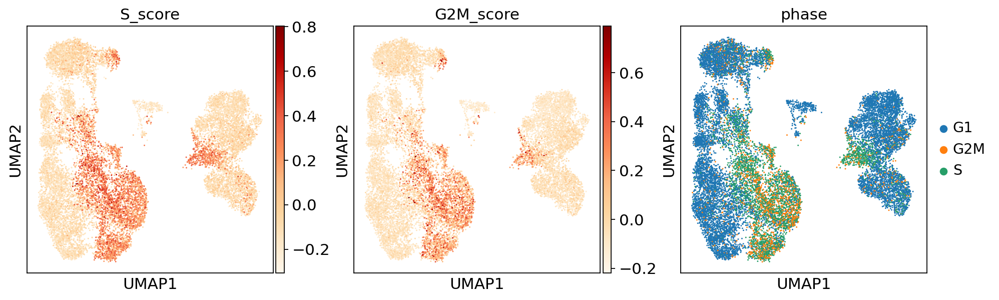

In [82]:
sc.pl.umap(adata_hvg, color=['S_score','G2M_score','phase'], cmap='OrRd')

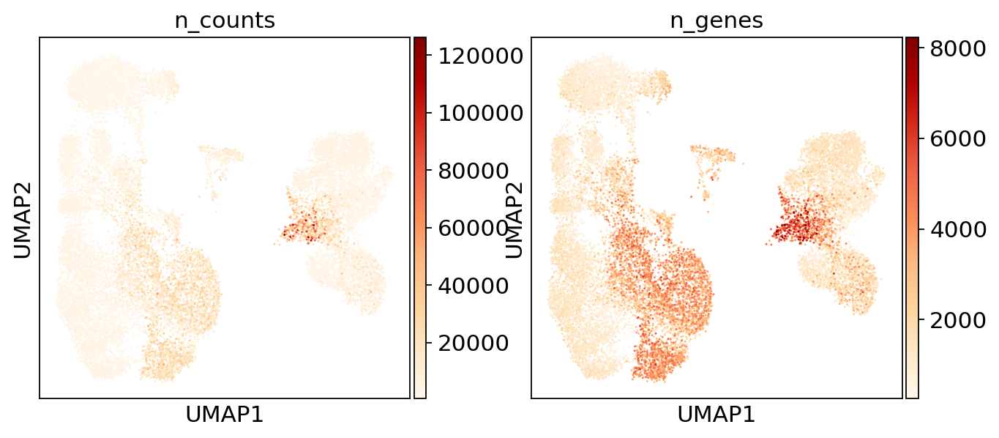

In [83]:
sc.pl.umap(adata_hvg, color=['n_counts',
                             'n_genes'], cmap='OrRd')

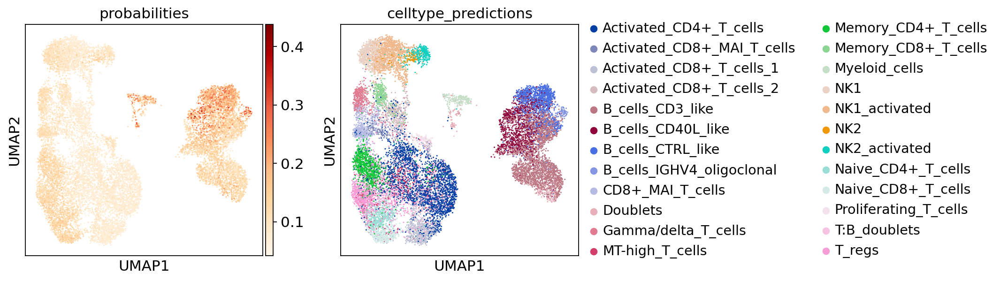

In [84]:
sc.pl.umap(adata_hvg, color=['probabilities','celltype_predictions'], cmap='OrRd')

In [85]:
adata_hvg

AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap', 'activation_colors', 'sample_colors', 'cell_type_colors', 'condition_colors', 'phase_colors', 'celltype_predictions_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obs

# Saving the final version of this data

In [86]:
# resaving later
#adata_hvg.write(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

In [23]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

In [12]:
# adding corrected annotation as of 08.03.2021
annot_corrected = pd.read_csv(save_path + 'general_annotation_20210308.csv', index_col=0)

In [13]:
annot_corrected

,cell_type
index,
TCAGGATCAGTTTACG-1,B_cells_memory_activated
GATCGCGTCCTACAGA-1,B_cells_naive
CTTGGCTCATTATCTC-1,T_regs
TGTATTCGTACGCTGC-1,T8_activated_1
GTGTTAGGTCCGCTGA-1,T_gd
...,...
TTAGGACGTTCGTCTC-1,B_cells_memory_activated
GCGCAGTAGCCTCGTG-1,B_cells_memory
AAGACCTCAAGTAGTA-1,B_cells_naive_activated


In [14]:
annot_corrected['cell_type'].value_counts()

T4_activated                2927
B_cells_memory_activated    2472
T4_memory                   1772
B_cells_naive               1568
NK_CD16_bright_activated    1235
T8_activated_1               830
NK_CD16_bright               763
T_gd                         697
B_cells_naive_activated      696
T4_naive                     675
T8_memory                    558
T8_naive                     408
B_cells_memory               391
T_regs                       388
MAIT_cells                   299
T8_activated_2               288
Myeloid_cells                285
NK_CD56_bright               238
MAIT_cells_activated         219
B:T_doublets_by_BCR          210
NK_CD56_bright_activated     200
B_cells_oligoclonal          196
Name: cell_type, dtype: int64

In [15]:
annot_corrected = annot_corrected[annot_corrected['cell_type'] != 'B:T_doublets_by_BCR']

In [16]:
annot_corrected['cell_type'].value_counts()

T4_activated                2927
B_cells_memory_activated    2472
T4_memory                   1772
B_cells_naive               1568
NK_CD16_bright_activated    1235
T8_activated_1               830
NK_CD16_bright               763
T_gd                         697
B_cells_naive_activated      696
T4_naive                     675
T8_memory                    558
T8_naive                     408
B_cells_memory               391
T_regs                       388
MAIT_cells                   299
T8_activated_2               288
Myeloid_cells                285
NK_CD56_bright               238
MAIT_cells_activated         219
NK_CD56_bright_activated     200
B_cells_oligoclonal          196
Name: cell_type, dtype: int64

In [17]:
annot_corrected

,cell_type
index,
TCAGGATCAGTTTACG-1,B_cells_memory_activated
GATCGCGTCCTACAGA-1,B_cells_naive
CTTGGCTCATTATCTC-1,T_regs
TGTATTCGTACGCTGC-1,T8_activated_1
GTGTTAGGTCCGCTGA-1,T_gd
...,...
TTAGGACGTTCGTCTC-1,B_cells_memory_activated
GCGCAGTAGCCTCGTG-1,B_cells_memory
AAGACCTCAAGTAGTA-1,B_cells_naive_activated


In [18]:
adata_hvg

AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'ccgs', 'cell_type_colors', 'celltype_predictions_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'conne

In [19]:
adata_hvg.obs['cell_type'].value_counts()

B_cells_memory_activated    2376
T4_memory                   1772
T4_activated                1739
T_regs                      1576
B_cells_naive               1547
NK_CD16_bright_activated    1235
T8_activated_1               830
NK_CD16_bright               763
T_gd                         697
T4_naive                     675
B_cells_naive_activated      659
T8_memory                    558
T8_naive                     408
B_cells_memory               347
MAIT_cells                   299
T8_activated_2               288
Myeloid_cells                285
NK_CD56_bright               238
MAIT_cells_activated         219
NK_CD56_bright_activated     200
B_cells_oligoclonal          190
Name: cell_type, dtype: int64

In [20]:
adata_hvg.obs['cell_type_corrected'] = annot_corrected.loc[adata_hvg.obs_names, 'cell_type']

... storing 'cell_type_corrected' as categorical


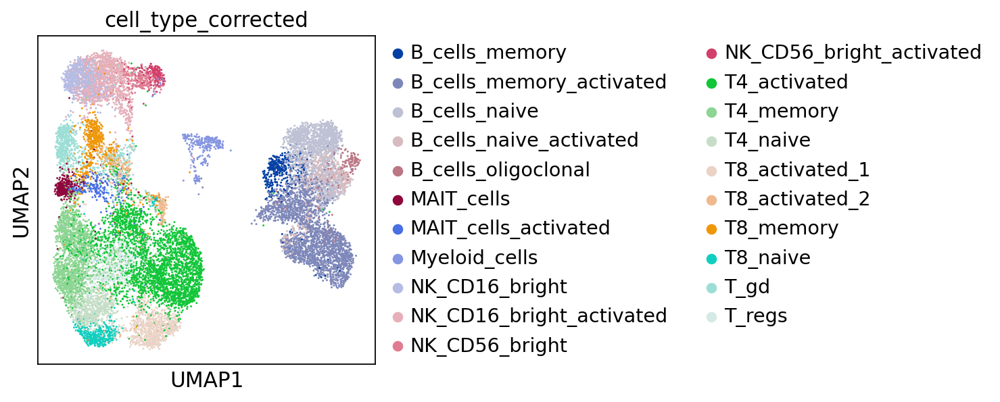

In [21]:
sc.pl.umap(adata_hvg, color='cell_type_corrected')

In [22]:
adata_hvg.write(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

In [9]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

In [12]:
# reading in annotation with corrected naive B cells and activated naive B cells
annot_new = pd.read_csv(save_path + '20210322_annotation_twins_final.csv', index_col=0)
adata_hvg.obs['cell_type_corrected_final'] = annot_new.loc[adata_hvg.obs_names, 'cell_type_corrected_final']

In [13]:
annot_new

,cell_type_corrected_final
index,
TCAGGATCAGTTTACG-1,B_cells_memory_activated
GATCGCGTCCTACAGA-1,B_cells_naive
CTTGGCTCATTATCTC-1,T_regs
TGTATTCGTACGCTGC-1,T8_activated_1
GTGTTAGGTCCGCTGA-1,T_gd
...,...
TTAGGACGTTCGTCTC-1,B_cells_memory_activated
GCGCAGTAGCCTCGTG-1,B_cells_memory
AAGACCTCAAGTAGTA-1,B_cells_naive_activated


... storing 'cell_type_corrected_final' as categorical


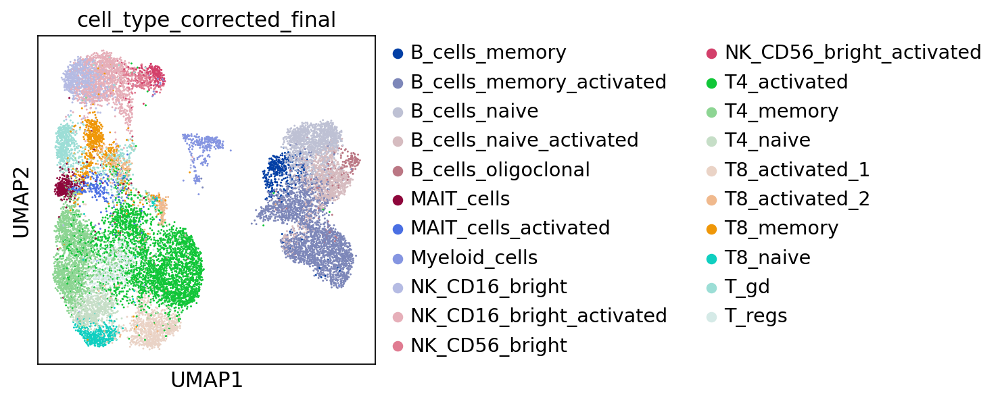

In [14]:
sc.pl.umap(adata_hvg, color='cell_type_corrected_final')

In [15]:
adata_hvg.write(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

In [6]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

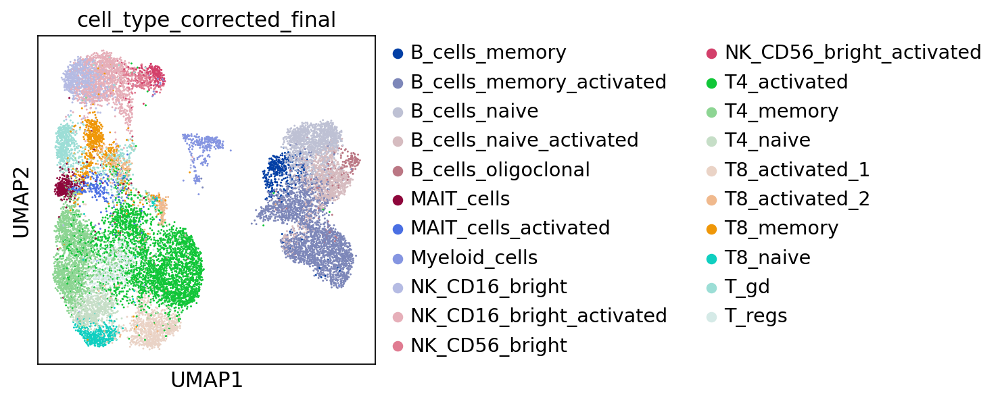

In [11]:
sc.pl.umap(adata_hvg, color='cell_type_corrected_final', save='_twins_general_manifold_final_annotation_20200329.pdf')

In [12]:
adata_hvg

AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase', 'cell_type_corrected', 'cell_type_corrected_final'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'ccgs', 'cell_type_colors', 'cell_type_corrected_colors', 'cell_type_corrected_final_colors', 'celltype_predictions_colors', 'condition_colors', 'hvg', 'n

In [14]:
adata_hvg.obs.columnsmns

Index(['activation', 'barcode_sample', 'batch', 'bh_pval', 'condition',
       'n_counts', 'n_genes', 'percent_mito', 'sample',
       'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet',
       'probabilities', 'celltype_predictions', 'cell_type', 'S_score',
       'G2M_score', 'phase', 'cell_type_corrected',
       'cell_type_corrected_final'],
      dtype='object')

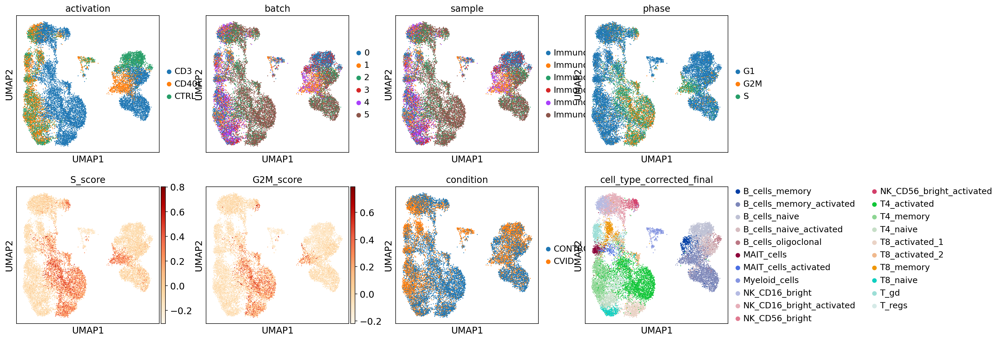

In [17]:
sc.pl.umap(adata_hvg, color=['activation','batch','sample','phase','S_score','G2M_score','condition','cell_type_corrected_final'], 
           cmap='OrRd', save='_twins_general_manifold_important_keys_plot_20200329.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)


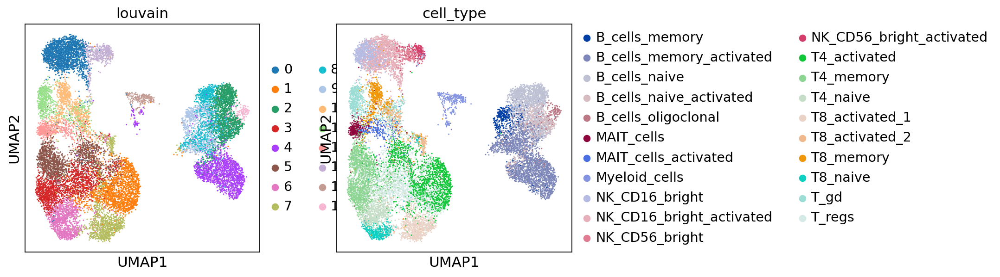

In [88]:
sc.tl.louvain(adata_hvg, resolution=1.5)
sc.pl.umap(adata_hvg, color=['louvain','cell_type'])

In [35]:
# adding GC-like B cell predictions
predictions = pd.read_csv(save_path + 'table_predictions_GC_B_cells_20210216.csv', index_col=0)
predictions

,GC_celltype_predictions_all_genes,probabilities_GC_all_genes
index,,
TCAGGATCAGTTTACG-1,GC_B_cells,0.924863
GATCGCGTCCTACAGA-1,Other_B_cells,0.891639
CGATCGGCACGGCCAT-1,Other_B_cells,0.865484
CATGACACAACCGCCA-1,Other_B_cells,0.860315
GACAGAGAGTGTTTGC-1,Other_B_cells,0.600734
...,...,...
CGGCTAGAGGACTGGT-1,GC_B_cells,0.605533
CGACCTTAGTCAAGCG-1,Other_B_cells,0.772888
TTAGGACGTTCGTCTC-1,Other_B_cells,0.591494


In [36]:
adata_hvg.obs['GC_celltype_predictions_all_genes'] = [predictions.loc[barcode, 'GC_celltype_predictions_all_genes'] if barcode in predictions.index else 'NA' for barcode in adata_hvg.obs_names]
adata_hvg.obs['probabilities_GC_all_genes'] = [predictions.loc[barcode, 'probabilities_GC_all_genes'] if barcode in predictions.index else 0 for barcode in adata_hvg.obs_names]

### Producing a plot of the number of B cells in each cell cycle phase per (a) activation; (b) CIVD/CONTROL status and (c) Naive/memory/plasma compartments

In [18]:
np.unique(adata_hvg.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal', 'MAIT_cells',
       'MAIT_cells_activated', 'Myeloid_cells', 'NK_CD16_bright',
       'NK_CD16_bright_activated', 'NK_CD56_bright',
       'NK_CD56_bright_activated', 'T4_activated', 'T4_memory',
       'T4_naive', 'T8_activated_1', 'T8_activated_2', 'T8_memory',
       'T8_naive', 'T_gd', 'T_regs'], dtype=object)

In [19]:
# all B cells except Plasma cells
adata_hvg_B_cell_compartment = adata_hvg[adata_hvg.obs['cell_type'].isin(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
                                                                          'B_cells_naive_activated', 'B_cells_oligoclonal'])].copy()

I need to generate tables of number of celltypes by the following keys:
- celltype_condition
- stimulation_celltype_condition
- GC_phenotype_celltype_condition

In [20]:
adata_hvg_B_cell_compartment.obs['celltype_condition'] = [i + '_' + j for i,j in zip(adata_hvg_B_cell_compartment.obs['cell_type'], 
                                                                                                adata_hvg_B_cell_compartment.obs['condition'])]

In [21]:
np.unique(adata_hvg_B_cell_compartment.obs['celltype_condition'])

array(['B_cells_memory_CONTROL', 'B_cells_memory_CVID',
       'B_cells_memory_activated_CONTROL',
       'B_cells_memory_activated_CVID', 'B_cells_naive_CONTROL',
       'B_cells_naive_CVID', 'B_cells_naive_activated_CONTROL',
       'B_cells_naive_activated_CVID', 'B_cells_oligoclonal_CONTROL',
       'B_cells_oligoclonal_CVID'], dtype=object)

In [22]:
adata_hvg_B_cell_compartment.obs['stimulation_celltype_condition'] = [i + '_' + j for i,j in zip(adata_hvg_B_cell_compartment.obs['activation'], 
                                                                                                adata_hvg_B_cell_compartment.obs['celltype_condition'])]

In [23]:
np.unique(adata_hvg_B_cell_compartment.obs['stimulation_celltype_condition'])

array(['CD3_B_cells_memory_CONTROL', 'CD3_B_cells_memory_CVID',
       'CD3_B_cells_memory_activated_CONTROL',
       'CD3_B_cells_memory_activated_CVID', 'CD3_B_cells_naive_CONTROL',
       'CD3_B_cells_naive_CVID', 'CD3_B_cells_naive_activated_CONTROL',
       'CD3_B_cells_naive_activated_CVID',
       'CD3_B_cells_oligoclonal_CONTROL', 'CD3_B_cells_oligoclonal_CVID',
       'CD40L_B_cells_memory_CONTROL', 'CD40L_B_cells_memory_CVID',
       'CD40L_B_cells_memory_activated_CONTROL',
       'CD40L_B_cells_memory_activated_CVID',
       'CD40L_B_cells_naive_CONTROL', 'CD40L_B_cells_naive_CVID',
       'CD40L_B_cells_naive_activated_CONTROL',
       'CD40L_B_cells_naive_activated_CVID',
       'CD40L_B_cells_oligoclonal_CONTROL',
       'CD40L_B_cells_oligoclonal_CVID', 'CTRL_B_cells_memory_CONTROL',
       'CTRL_B_cells_memory_CVID',
       'CTRL_B_cells_memory_activated_CONTROL',
       'CTRL_B_cells_memory_activated_CVID', 'CTRL_B_cells_naive_CONTROL',
       'CTRL_B_cells_naive_CVID

In [24]:
adata_hvg_B_cell_compartment.obs['GC_phenotype_celltype_condition'] = [i + '_' + j for i,j in zip(adata_hvg_B_cell_compartment.obs['GC_celltype_predictions_all_genes'], 
                                                                                                adata_hvg_B_cell_compartment.obs['celltype_condition'])]

In [25]:
np.unique(adata_hvg_B_cell_compartment.obs['GC_phenotype_celltype_condition'])

array(['GC_B_cells_B_cells_memory_CONTROL',
       'GC_B_cells_B_cells_memory_CVID',
       'GC_B_cells_B_cells_memory_activated_CONTROL',
       'GC_B_cells_B_cells_memory_activated_CVID',
       'GC_B_cells_B_cells_naive_CONTROL',
       'GC_B_cells_B_cells_naive_CVID',
       'GC_B_cells_B_cells_naive_activated_CONTROL',
       'GC_B_cells_B_cells_naive_activated_CVID',
       'GC_B_cells_B_cells_oligoclonal_CONTROL',
       'GC_B_cells_B_cells_oligoclonal_CVID',
       'Other_B_cells_B_cells_memory_CONTROL',
       'Other_B_cells_B_cells_memory_CVID',
       'Other_B_cells_B_cells_memory_activated_CONTROL',
       'Other_B_cells_B_cells_memory_activated_CVID',
       'Other_B_cells_B_cells_naive_CONTROL',
       'Other_B_cells_B_cells_naive_CVID',
       'Other_B_cells_B_cells_naive_activated_CONTROL',
       'Other_B_cells_B_cells_naive_activated_CVID',
       'Other_B_cells_B_cells_oligoclonal_CONTROL',
       'Other_B_cells_B_cells_oligoclonal_CVID'], dtype=object)

In [26]:
df_stats_phase_by_celltype_condition = pd.DataFrame(columns=list(np.unique(adata_hvg_B_cell_compartment.obs['phase'])),
                     index=list(np.unique(adata_hvg_B_cell_compartment.obs['celltype_condition'])))

In [27]:
df_stats_phase_by_celltype_condition

,G1,G2M,S
B_cells_memory_CONTROL,NaN,NaN,NaN
B_cells_memory_CVID,NaN,NaN,NaN
B_cells_memory_activated_CONTROL,NaN,NaN,NaN
B_cells_memory_activated_CVID,NaN,NaN,NaN
B_cells_naive_CONTROL,NaN,NaN,NaN
B_cells_naive_CVID,NaN,NaN,NaN
B_cells_naive_activated_CONTROL,NaN,NaN,NaN
B_cells_naive_activated_CVID,NaN,NaN,NaN
B_cells_oligoclonal_CONTROL,NaN,NaN,NaN
B_cells_oligoclonal_CVID,NaN,NaN,NaN


In [28]:
for phase in df_stats_phase_by_celltype_condition.columns:
    print('phase', phase)
    for key in df_stats_phase_by_celltype_condition.index:
        #print(sample)
        df_stats_phase_by_celltype_condition.loc[key, phase] = adata_hvg_B_cell_compartment[(adata_hvg_B_cell_compartment.obs['celltype_condition'] == key)
                                         & (adata_hvg_B_cell_compartment.obs['phase'] == phase)].X.shape[0]

phase G1
phase G2M
phase S


In [29]:
df_stats_phase_by_celltype_condition

,G1,G2M,S
B_cells_memory_CONTROL,196,16,33
B_cells_memory_CVID,90,3,9
B_cells_memory_activated_CONTROL,1134,112,266
B_cells_memory_activated_CVID,512,54,298
B_cells_naive_CONTROL,559,39,31
B_cells_naive_CVID,897,9,12
B_cells_naive_activated_CONTROL,266,25,20
B_cells_naive_activated_CVID,327,10,11
B_cells_oligoclonal_CONTROL,71,7,6
B_cells_oligoclonal_CVID,94,1,11


In [30]:
df_stats_phase_by_stimulation_celltype_condition = pd.DataFrame(columns=list(np.unique(adata_hvg_B_cell_compartment.obs['phase'])),
                     index=list(np.unique(adata_hvg_B_cell_compartment.obs['stimulation_celltype_condition'])))

In [31]:
df_stats_phase_by_stimulation_celltype_condition

,G1,G2M,S
CD3_B_cells_memory_CONTROL,NaN,NaN,NaN
CD3_B_cells_memory_CVID,NaN,NaN,NaN
CD3_B_cells_memory_activated_CONTROL,NaN,NaN,NaN
CD3_B_cells_memory_activated_CVID,NaN,NaN,NaN
CD3_B_cells_naive_CONTROL,NaN,NaN,NaN
CD3_B_cells_naive_CVID,NaN,NaN,NaN
CD3_B_cells_naive_activated_CONTROL,NaN,NaN,NaN
CD3_B_cells_naive_activated_CVID,NaN,NaN,NaN
CD3_B_cells_oligoclonal_CONTROL,NaN,NaN,NaN
CD3_B_cells_oligoclonal_CVID,NaN,NaN,NaN


In [32]:
for phase in df_stats_phase_by_stimulation_celltype_condition.columns:
    print('phase', phase)
    for key in df_stats_phase_by_stimulation_celltype_condition.index:
        #print(key)
        df_stats_phase_by_stimulation_celltype_condition.loc[key, phase] = adata_hvg_B_cell_compartment[(adata_hvg_B_cell_compartment.obs['stimulation_celltype_condition'] == key)
                                         & (adata_hvg_B_cell_compartment.obs['phase'] == phase)].X.shape[0]

phase G1
phase G2M
phase S


In [33]:
df_stats_phase_by_stimulation_celltype_condition

,G1,G2M,S
CD3_B_cells_memory_CONTROL,72,8,7
CD3_B_cells_memory_CVID,24,0,1
CD3_B_cells_memory_activated_CONTROL,974,95,121
CD3_B_cells_memory_activated_CVID,332,8,49
CD3_B_cells_naive_CONTROL,242,31,24
CD3_B_cells_naive_CVID,114,7,6
CD3_B_cells_naive_activated_CONTROL,233,24,20
CD3_B_cells_naive_activated_CVID,213,10,11
CD3_B_cells_oligoclonal_CONTROL,36,6,4
CD3_B_cells_oligoclonal_CVID,22,1,2


In [34]:
df_stats_phase_by_GC_phenotype_celltype_condition = pd.DataFrame(columns=list(np.unique(adata_hvg_B_cell_compartment.obs['phase'])),
                     index=list(np.unique(adata_hvg_B_cell_compartment.obs['GC_phenotype_celltype_condition'])))

In [35]:
df_stats_phase_by_GC_phenotype_celltype_condition

,G1,G2M,S
GC_B_cells_B_cells_memory_CONTROL,NaN,NaN,NaN
GC_B_cells_B_cells_memory_CVID,NaN,NaN,NaN
GC_B_cells_B_cells_memory_activated_CONTROL,NaN,NaN,NaN
GC_B_cells_B_cells_memory_activated_CVID,NaN,NaN,NaN
GC_B_cells_B_cells_naive_CONTROL,NaN,NaN,NaN
GC_B_cells_B_cells_naive_CVID,NaN,NaN,NaN
GC_B_cells_B_cells_naive_activated_CONTROL,NaN,NaN,NaN
GC_B_cells_B_cells_naive_activated_CVID,NaN,NaN,NaN
GC_B_cells_B_cells_oligoclonal_CONTROL,NaN,NaN,NaN
GC_B_cells_B_cells_oligoclonal_CVID,NaN,NaN,NaN


In [36]:
for phase in df_stats_phase_by_GC_phenotype_celltype_condition.columns:
    print('phase', phase)
    for key in df_stats_phase_by_GC_phenotype_celltype_condition.index:
        #print(key)
        df_stats_phase_by_GC_phenotype_celltype_condition.loc[key, phase] = adata_hvg_B_cell_compartment[(adata_hvg_B_cell_compartment.obs['GC_phenotype_celltype_condition'] == key)
                                         & (adata_hvg_B_cell_compartment.obs['phase'] == phase)].X.shape[0]

phase G1
phase G2M
phase S


In [37]:
df_stats_phase_by_GC_phenotype_celltype_condition

,G1,G2M,S
GC_B_cells_B_cells_memory_CONTROL,40,9,28
GC_B_cells_B_cells_memory_CVID,12,2,9
GC_B_cells_B_cells_memory_activated_CONTROL,597,70,237
GC_B_cells_B_cells_memory_activated_CVID,279,53,296
GC_B_cells_B_cells_naive_CONTROL,103,18,7
GC_B_cells_B_cells_naive_CVID,67,2,2
GC_B_cells_B_cells_naive_activated_CONTROL,137,15,10
GC_B_cells_B_cells_naive_activated_CVID,112,3,6
GC_B_cells_B_cells_oligoclonal_CONTROL,21,5,5
GC_B_cells_B_cells_oligoclonal_CVID,19,0,9


In [38]:
df_all_stats = pd.concat([df_stats_phase_by_celltype_condition, df_stats_phase_by_GC_phenotype_celltype_condition, df_stats_phase_by_stimulation_celltype_condition])

In [39]:
df_all_stats

,G1,G2M,S
B_cells_memory_CONTROL,196,16,33
B_cells_memory_CVID,90,3,9
B_cells_memory_activated_CONTROL,1134,112,266
B_cells_memory_activated_CVID,512,54,298
B_cells_naive_CONTROL,559,39,31
B_cells_naive_CVID,897,9,12
B_cells_naive_activated_CONTROL,266,25,20
B_cells_naive_activated_CVID,327,10,11
B_cells_oligoclonal_CONTROL,71,7,6
B_cells_oligoclonal_CVID,94,1,11


In [40]:
df_all_stats.to_csv('./B_cell_stats_phase_all_twins_20210217.csv')

In [25]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

### Producing a plot of the number of CD4+ T (T4) cells in each cell cycle phase per (a) activation and (b) CIVD/CONTROL status

In [26]:
np.unique(adata_hvg.obs['cell_type_corrected'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal', 'MAIT_cells',
       'MAIT_cells_activated', 'Myeloid_cells', 'NK_CD16_bright',
       'NK_CD16_bright_activated', 'NK_CD56_bright',
       'NK_CD56_bright_activated', 'T4_activated', 'T4_memory',
       'T4_naive', 'T8_activated_1', 'T8_activated_2', 'T8_memory',
       'T8_naive', 'T_gd', 'T_regs'], dtype=object)

In [38]:
# all T4 cells
adata_hvg_T4_compartment = adata_hvg[adata_hvg.obs['cell_type'].isin(['T4_activated', 'T4_memory', 'T4_naive'])].copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [39]:
adata_hvg_T4_compartment

AnnData object with n_obs × n_vars = 4186 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase', 'cell_type_corrected', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'ccgs', 'cell_type_colors', 'cell_type_corrected_colors', 'celltype_predictions_colors', 'condition_colors', 'hvg', '

I need to generate tables of number of celltypes by the following keys:
- celltype_condition
- stimulation_celltype_condition

In [40]:
adata_hvg_T4_compartment.obs['celltype_condition'] = [i + '_' + j for i,j in zip(adata_hvg_T4_compartment.obs['cell_type_corrected'], 
                                                                                                adata_hvg_T4_compartment.obs['condition'])]

In [41]:
np.unique(adata_hvg_T4_compartment.obs['celltype_condition'])

array(['T4_activated_CONTROL', 'T4_activated_CVID', 'T4_memory_CONTROL',
       'T4_memory_CVID', 'T4_naive_CONTROL', 'T4_naive_CVID'],
      dtype=object)

In [42]:
adata_hvg_T4_compartment.obs['stimulation_celltype_condition'] = [i + '_' + j for i,j in zip(adata_hvg_T4_compartment.obs['activation'], 
                                                                                                adata_hvg_T4_compartment.obs['celltype_condition'])]

In [43]:
np.unique(adata_hvg_T4_compartment.obs['stimulation_celltype_condition'])

array(['CD3_T4_activated_CONTROL', 'CD3_T4_activated_CVID',
       'CD3_T4_memory_CONTROL', 'CD3_T4_memory_CVID',
       'CD3_T4_naive_CONTROL', 'CD3_T4_naive_CVID',
       'CD40L_T4_activated_CONTROL', 'CD40L_T4_activated_CVID',
       'CD40L_T4_memory_CONTROL', 'CD40L_T4_memory_CVID',
       'CD40L_T4_naive_CONTROL', 'CD40L_T4_naive_CVID',
       'CTRL_T4_activated_CONTROL', 'CTRL_T4_activated_CVID',
       'CTRL_T4_memory_CONTROL', 'CTRL_T4_memory_CVID',
       'CTRL_T4_naive_CONTROL', 'CTRL_T4_naive_CVID'], dtype=object)

In [46]:
df_stats_phase_by_celltype_condition = pd.DataFrame(columns=list(np.unique(adata_hvg_T4_compartment.obs['phase'])),
                     index=list(np.unique(adata_hvg_T4_compartment.obs['celltype_condition'])))

In [47]:
df_stats_phase_by_celltype_condition

,G1,G2M,S
T4_activated_CONTROL,NaN,NaN,NaN
T4_activated_CVID,NaN,NaN,NaN
T4_memory_CONTROL,NaN,NaN,NaN
T4_memory_CVID,NaN,NaN,NaN
T4_naive_CONTROL,NaN,NaN,NaN
T4_naive_CVID,NaN,NaN,NaN


In [48]:
for phase in df_stats_phase_by_celltype_condition.columns:
    print('phase', phase)
    for key in df_stats_phase_by_celltype_condition.index:
        #print(sample)
        df_stats_phase_by_celltype_condition.loc[key, phase] = adata_hvg_T4_compartment[(adata_hvg_T4_compartment.obs['celltype_condition'] == key)
                                         & (adata_hvg_T4_compartment.obs['phase'] == phase)].X.shape[0]

phase G1
phase G2M
phase S


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [49]:
df_stats_phase_by_celltype_condition

,G1,G2M,S
T4_activated_CONTROL,148,521,814
T4_activated_CVID,47,70,139
T4_memory_CONTROL,636,34,59
T4_memory_CVID,969,31,43
T4_naive_CONTROL,457,33,13
T4_naive_CVID,164,3,5


In [50]:
df_stats_phase_by_stimulation_celltype_condition = pd.DataFrame(columns=list(np.unique(adata_hvg_T4_compartment.obs['phase'])),
                     index=list(np.unique(adata_hvg_T4_compartment.obs['stimulation_celltype_condition'])))

In [51]:
df_stats_phase_by_stimulation_celltype_condition

,G1,G2M,S
CD3_T4_activated_CONTROL,NaN,NaN,NaN
CD3_T4_activated_CVID,NaN,NaN,NaN
CD3_T4_memory_CONTROL,NaN,NaN,NaN
CD3_T4_memory_CVID,NaN,NaN,NaN
CD3_T4_naive_CONTROL,NaN,NaN,NaN
CD3_T4_naive_CVID,NaN,NaN,NaN
CD40L_T4_activated_CONTROL,NaN,NaN,NaN
CD40L_T4_activated_CVID,NaN,NaN,NaN
CD40L_T4_memory_CONTROL,NaN,NaN,NaN
CD40L_T4_memory_CVID,NaN,NaN,NaN


In [52]:
for phase in df_stats_phase_by_stimulation_celltype_condition.columns:
    print('phase', phase)
    for key in df_stats_phase_by_stimulation_celltype_condition.index:
        #print(key)
        df_stats_phase_by_stimulation_celltype_condition.loc[key, phase] = adata_hvg_T4_compartment[(adata_hvg_T4_compartment.obs['stimulation_celltype_condition'] == key)
                                         & (adata_hvg_T4_compartment.obs['phase'] == phase)].X.shape[0]

phase G1
phase G2M


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


phase S


In [54]:
df_stats_phase_by_stimulation_celltype_condition

,G1,G2M,S
CD3_T4_activated_CONTROL,99,518,812
CD3_T4_activated_CVID,17,69,139
CD3_T4_memory_CONTROL,51,10,41
CD3_T4_memory_CVID,66,7,29
CD3_T4_naive_CONTROL,30,4,6
CD3_T4_naive_CVID,19,0,3
CD40L_T4_activated_CONTROL,28,3,2
CD40L_T4_activated_CVID,14,1,0
CD40L_T4_memory_CONTROL,399,21,17
CD40L_T4_memory_CVID,389,19,10


In [55]:
df_all_stats = pd.concat([df_stats_phase_by_celltype_condition, df_stats_phase_by_stimulation_celltype_condition])

In [58]:
df_all_stats

,G1,G2M,S
T4_activated_CONTROL,148,521,814
T4_activated_CVID,47,70,139
T4_memory_CONTROL,636,34,59
T4_memory_CVID,969,31,43
T4_naive_CONTROL,457,33,13
T4_naive_CVID,164,3,5
CD3_T4_activated_CONTROL,99,518,812
CD3_T4_activated_CVID,17,69,139
CD3_T4_memory_CONTROL,51,10,41
CD3_T4_memory_CVID,66,7,29


In [59]:
df_all_stats.to_csv('./T4_cell_stats_phase_all_twins_20210308.csv')

# Preparing the object for cellxgene

In [6]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')

In [7]:
adata_hvg

AnnData object with n_obs × n_vars = 16901 × 2428
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase', 'cell_type_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'ccgs', 'cell_type_colors', 'cell_type_corrected_colors', 'celltype_predictions_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obs

In [8]:
adata_full = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [9]:
adata_full

AnnData object with n_obs × n_vars = 16901 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'probabilities', 'celltype_predictions', 'cell_type', 'S_score', 'G2M_score', 'phase', 'cell_type_corrected'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    obsm: 'X_pca', 'X_umap'

In [10]:
import scipy
adata_full.X = scipy.sparse.csc_matrix(adata_full.X)


In [14]:
# for less confusion, dropping column 'cell_type' and only keeping 'cell_type_corrected'
adata_full.obs.drop('cell_type', axis=1, inplace=True)

In [15]:
adata_full.obs.columns

Index(['activation', 'barcode_sample', 'batch', 'bh_pval', 'condition',
       'n_counts', 'n_genes', 'percent_mito', 'sample',
       'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet',
       'probabilities', 'celltype_predictions', 'S_score', 'G2M_score',
       'phase', 'cell_type_corrected'],
      dtype='object')

In [16]:
categ_columns = ['activation', 'batch', 'condition',
                 'sample', 'celltype_predictions',
                 'phase', 'cell_type_corrected']

cont_columns = ['n_counts', 'n_genes', 'percent_mito', 
                'scrublet_cluster_score', 'probabilities',
                'S_score', 'G2M_score']


In [17]:
import pandas
for column in categ_columns:
    adata_full.obs[column] = pd.Categorical(adata_full.obs[column])
    
for column in cont_columns:
    adata_full.obs[column] = np.float32(adata_full.obs[column])

In [18]:
adata_full.write(save_path + '20210318_adata_BBKNN_by_sample_twins_reanalysed_for_cellxgene.h5ad')

In [19]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'